## Vehicle Detection and Tracking

#### Import Statements

In [1]:
from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
# from sklearn.cross_validation import train_test_split
from scipy.ndimage.measurements import label
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import numpy as np
import pickle
import cv2
import glob
import time
import random
from Project5_Functions import *
import pandas as pd

%matplotlib inline

### Functions

In [2]:
# 1. Function to get hog features
# ---------------------------------
# PARAMETERS:
# pix_per_cell = number of pixels in each cell (eg. 8x8)
# cell_per_block = number of cells in a block to be analyzed together
# feature_vec = True ; if unravel() the entire features into single vector ( eg. 7x7x2x9 == 1784) 
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell,pix_per_cell),
                                 cells_per_block=(cell_per_block, cell_per_block), visualise=vis,
                                 feature_vector = feature_vec)
        return features, hog_image
    else:
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell,pix_per_cell),
                                 cells_per_block=(cell_per_block, cell_per_block), visualise=vis,
                                 feature_vector = feature_vec)
    return features

# 2. Function to get binned color image features (i.e. reduce the size of the image and get on vector feature vector)
# -----------------------------------------------

def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

# 3. Function to compute different color histogram features
# ----------------------------------------------------------  
# nbins: number of bins the range is divided
# bins_range: the range of values that each colour can have.
# rhist, ghist, bhist returns tuple of two array; 
# In this case, for example, rhist[0] contains the counts in each of the bins and rhist[1] contains the bin edges 
# (so it is one element longer than rhist[0]). (tutorial 12)

def get_color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the RGB channels separately
    rhist = np.histogram(img[:,:,0], nbins, bins_range)
    ghist = np.histogram(img[:,:,1], nbins, bins_range)
    bhist = np.histogram(img[:,:,2], nbins, bins_range)
    
    # Generating bin centers
    bin_edges = rhist[1]
    bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])/2
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((rhist[0], ghist[0], bhist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return rhist, ghist, bhist, bin_centers, hist_features




#### Load Training data

In [3]:
car_images = glob.glob('./vehicles/**/*.png')
noncar_images = glob.glob('./non-vehicles/**/*.png')
print(len(car_images), len(noncar_images))

8792 8968


In [4]:
# shape of an images in the set
print("Image shape in Car set:", mpimg.imread(car_images[1]).shape)
print("Image shape in Non-Car set:", mpimg.imread(noncar_images[1]).shape)

Image shape in Car set: (64, 64, 3)
Image shape in Non-Car set: (64, 64, 3)


#### Visualize some randomly selected car and non-car images

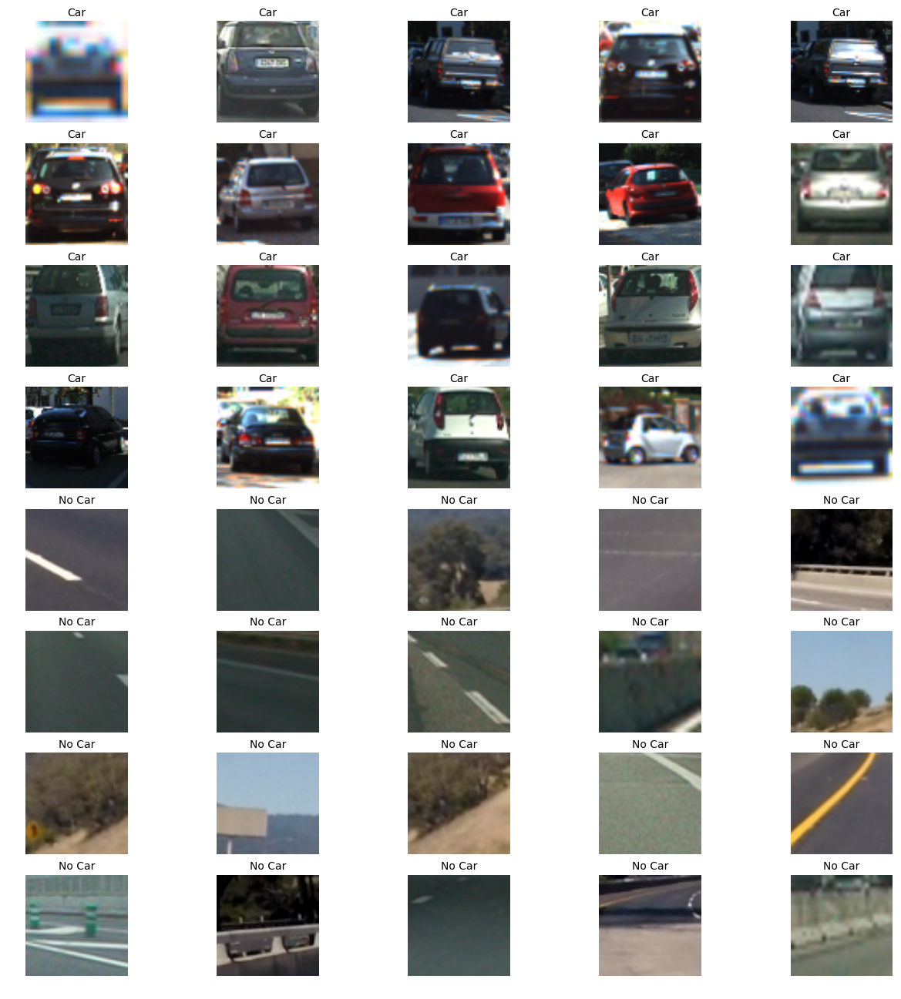

In [5]:
fig, axs = plt.subplots(8, 5, figsize=(16, 16))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()

lower = 0
upper = len(car_images)
lst = [random.randint(lower, upper) for x in range(40)]

# Step through the list and search for chessboard corners
for i in np.arange(20):
    img = mpimg.imread(car_images[lst[i]])
    #img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    axs[i].axis('off')
    axs[i].set_title('Car', fontsize=10)
    axs[i].imshow(img)

for i in np.arange(20, 40):
    img = mpimg.imread(noncar_images[lst[i]])
    #img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    axs[i].axis('off')
    axs[i].set_title('No Car', fontsize=10)
    axs[i].imshow(img)

### Histogram of Oriented Gradients (HOG)

#### 1. Explain how (and identify where in your code) you extracted HOG features from the training images.

*Visualizing the code on a example car image*

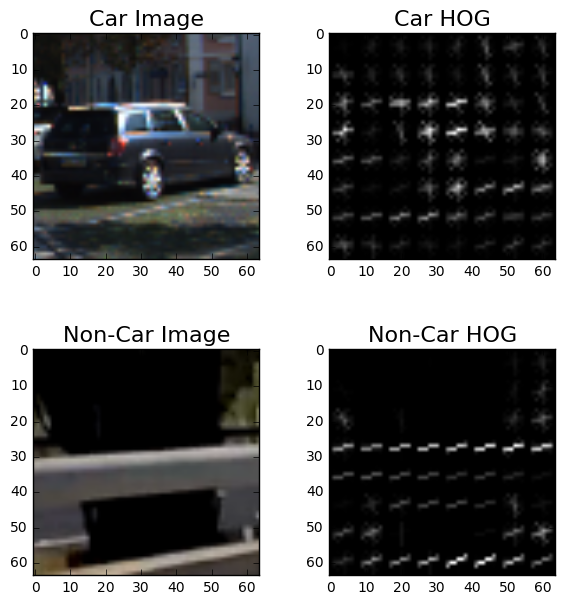

In [6]:
# images
car_img = mpimg.imread(car_images[np.random.randint(0, len(car_images))])
noncar_img = mpimg.imread(noncar_images[np.random.randint(0, len(car_images))])

# Hog Parameters
orient = 9
cell_per_block = 2
pixels_per_cell = 8

# Hog Features and Image
car_hog_features, car_hogimg = get_hog_features(car_img[:,:,2], orient, pixels_per_cell, cell_per_block, 
                                            vis=True, feature_vec=True)
noncar_hog_features, noncar_hogimg = get_hog_features(noncar_img[:,:,2], orient, pixels_per_cell, cell_per_block,
                                                      vis=True, feature_vec=True)


f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(7,7))
f.subplots_adjust(hspace = .4, wspace=.2)

ax1.imshow(car_img)
ax1.set_title('Car Image', fontsize=16)
ax2.imshow(car_hogimg, cmap='gray')
ax2.set_title('Car HOG', fontsize=16)
ax3.imshow(noncar_img)
ax3.set_title('Non-Car Image', fontsize=16)
ax4.imshow(noncar_hogimg, cmap='gray')
ax4.set_title('Non-Car HOG', fontsize=16)


#### 2. Explain how you settled on your final choice of HOG parameters.

#### Function to extract Hog Features from a list of images

In [7]:
# The function to extract features like Binned Color Image features, Color Histogram features and Hog features from 
# a list of images, Therefore, to extract Hog Features, I will put the other features as 'False'

# listof_imgs = list of images
# color_space = "RGB, "HSV", "LUV", "YUV", "YCrCb"
# orient =  The number of orientation bins that the gradient information will be split up, 6-12
# hog_channel = "ALL", "0","1","2"
# pix_per_cell = number of pixels in each cell (eg. 8x8)
# cell_per_block = number of cells in a block to be analyzed together

def extract_features(listof_imgs, color_space='RGB', spatial_size=(32, 32),hist_bins=32, orient=9,
                         pix_per_cell=8, cell_per_block=2, hog_channel=0, spatial_feat=True, hist_feat=True, 
                         hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for fname in listof_imgs:
        image_features = []
        image = mpimg.imread(fname)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            image_features.append(spatial_features)
        
        if hist_feat == True:
            hist_features = get_color_hist(feature_image, nbins=hist_bins)
            image_features.append(hist_features)
        
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            
            # Append the new feature vector to the features list
            image_features.append(hog_features)
        features.append(np.concatenate(image_features))
    
    # Return list of feature vectors
    return features


#### Working with Hog features and create a train and test split for modelling

In [8]:
# working with different parameter combinations
list_ofcolorspace= ['RGB',"HSV","HLS","LUV","YUV","YCrCb"]
list_ofchannels = ["ALL", 0, 1, 2]
list_oforient = [9, 10, 11]
cell_per_block = 2
pixels_per_cell = 8

df_configuration = pd.DataFrame(columns=('Configuration Number', 'ColorSpace', 'Pixel_perCell', 'Cells_perBlock', 
                                         'Channel', 'Orientation'))
dict_carfeatures = {}
dict_noncarfeatures = {}

i = 0
for color_ in list_ofcolorspace:
    for channel_ in list_ofchannels:
        for orient_ in list_oforient:
            # storing the car and non-car features
            car_features = extract_features(car_images, color_space=color_, spatial_size = (32,32), hist_bins = 32,
                                            orient= orient_, pix_per_cell = pixels_per_cell, 
                                            cell_per_block = cell_per_block, hog_channel = channel_, 
                                            spatial_feat = False, hist_feat = False, hog_feat = True)
            noncar_features = extract_features(noncar_images, color_space=color_, spatial_size = (32,32), 
                                               hist_bins = 32, orient= orient_, pix_per_cell = pixels_per_cell, 
                                               cell_per_block = cell_per_block, hog_channel = channel_, 
                                               spatial_feat = False, hist_feat = False, hog_feat = True)
            
            # updating the dataframe to store different configuration
            df_configuration.loc[i] = [i, color_, pixels_per_cell, cell_per_block, channel_, orient_]
            dict_carfeatures[i] = car_features
            dict_noncarfeatures[i] = noncar_features
            i = i + 1


In [9]:
# I used different paramter combinations as displayed below
df_configuration

,Configuration Number,ColorSpace,Pixel_perCell,Cells_perBlock,Channel,Orientation
0,0.0,RGB,8.0,2.0,ALL,9.0
1,1.0,RGB,8.0,2.0,ALL,10.0
2,2.0,RGB,8.0,2.0,ALL,11.0
3,3.0,RGB,8.0,2.0,0,9.0
4,4.0,RGB,8.0,2.0,0,10.0
5,5.0,RGB,8.0,2.0,0,11.0
6,6.0,RGB,8.0,2.0,1,9.0
7,7.0,RGB,8.0,2.0,1,10.0
8,8.0,RGB,8.0,2.0,1,11.0
9,9.0,RGB,8.0,2.0,2,9.0


#### 3. Describe how (and identify where in your code) you trained a classifier using your selected HOG features (and color features if you used them).

In [41]:
df_stats = pd.DataFrame(columns=('Configuration Number', 'Classifier', 'Accuracy', 'TrainTime'))

# Training a Classifier
for num in range(len(df_configuration)):
    # Create an array stack of feature vectors
    X = np.vstack((dict_carfeatures[num], dict_noncarfeatures[num])).astype(np.float64)
    
    # Define the labels vector
    y = np.hstack((np.ones(len(dict_carfeatures[num])), np.zeros(len(dict_noncarfeatures[num]))))
    
    # Split up data into randomized training and test sets
    rand_state = np.random.randint(0, 100)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=rand_state)
    
    # Use a linear SVC 
    svc = LinearSVC()
    # Check the training time for the SVC
    t = time.time()
    svc.fit(X_train, y_train)
    t2 = time.time()
    
    # Checking the accuracy
    accuracy = round(svc.score(X_test, y_test), 4)
    
    df_stats.loc[num] = [num, "Linear SVC", accuracy, round(t2-t, 2)]
    


In [42]:
# printing the output of classifier
df_stats

,Configuration Number,Classifier,Accuracy,TrainTime
0,0.0,Linear SVC,0.9741,20.87
1,1.0,Linear SVC,0.9744,16.28
2,2.0,Linear SVC,0.9724,26.88
3,3.0,Linear SVC,0.9611,5.79
4,4.0,Linear SVC,0.9510,5.21
5,5.0,Linear SVC,0.9541,7.12
6,6.0,Linear SVC,0.9617,5.63
7,7.0,Linear SVC,0.9606,4.11
8,8.0,Linear SVC,0.9626,4.64
9,9.0,Linear SVC,0.9676,4.13


In [43]:
# save the dataframe and dictionaries
df_configuration.to_csv('Diff_Configuration.csv')
df_stats.to_csv('Model_accuracy.csv')
#np.save('car_features.npy', dict_carfeatures)
#np.save('noncar_features.npy', dict_noncarfeatures)

# load it again
#dict_carfeatures = np.load('car_features.npy').item()
#dict_noncarfeatures = np.load('noncar_features.npy').item()

In [44]:
#df_stats['Accuracy'].argmax()
df_stats.nlargest(15, 'Accuracy')

,Configuration Number,Classifier,Accuracy,TrainTime
13,13.0,Linear SVC,0.9862,9.68
60,60.0,Linear SVC,0.9854,11.51
49,49.0,Linear SVC,0.9851,7.87
61,61.0,Linear SVC,0.9845,6.94
24,24.0,Linear SVC,0.9834,14.03
25,25.0,Linear SVC,0.9828,9.06
50,50.0,Linear SVC,0.9820,7.60
12,12.0,Linear SVC,0.9817,13.23
14,14.0,Linear SVC,0.9811,12.09
26,26.0,Linear SVC,0.9809,13.70


#### As the training time depend upon the system used, after many iterations, I had chosen configuration 61, 49, 50 and 13 as the best in terms of Accuracy and Time taken to train.

In [23]:
df_configuration.ix[61]

Configuration Number       61
ColorSpace              YCrCb
Pixel_perCell               8
Cells_perBlock              2
Channel                   ALL
Orientation                10
Name: 61, dtype: object

In [24]:
df_configuration.ix[49]

Configuration Number     49
ColorSpace              YUV
Pixel_perCell             8
Cells_perBlock            2
Channel                 ALL
Orientation              10
Name: 49, dtype: object

In [16]:
df_configuration.ix[13]

Configuration Number     13
ColorSpace              HSV
Pixel_perCell             8
Cells_perBlock            2
Channel                 ALL
Orientation              10
Name: 13, dtype: object

In [45]:
df_configuration.ix[50]

Configuration Number     50
ColorSpace              YUV
Pixel_perCell             8
Cells_perBlock            2
Channel                 ALL
Orientation              11
Name: 50, dtype: object

-------------------
### Sliding Window Search

#### 1. Describe how (and identify where in your code) you implemented a sliding window search. How did you decide what scales to search and how much to overlap windows?

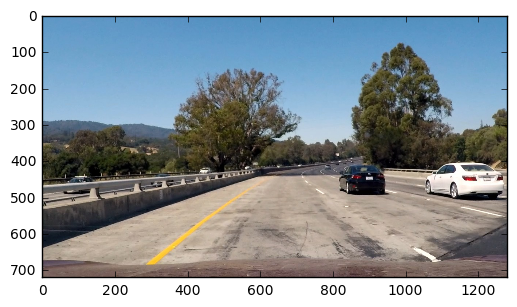

In [25]:
# Image to be used for testing
test_img = mpimg.imread('./test_images/test1.jpg')
plt.imshow(test_img)

In [26]:
# shape of the image
test_img.shape

(720, 1280, 3)

In [27]:
# shape of the car and non car images, the classifier is trained on
mpimg.imread(car_images[1]).shape

(64, 64, 3)

####  Function that can extract features using hog sub-sampling and make predictions

In [28]:
# Fit a per-column scaler - this will be necessary if combining different types of features (HOG + color_hist/bin_spatial)
#X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
#scaled_X = X_scaler.transform(X)

def find_cars(image, ystart, ystop, scale, cspace, hog_channel, svc, X_scaler, orient, pix_per_cell, 
              cell_per_block, spatial_size, hist_bins, show_all_windows=False):
    
    # array of windows where cars were detected
    windows = []
    
    # resizing the pixels to range 0-1
    img = image.astype(np.float32)/255
    
    # the height of the image uptil the height to search for cars
    img_tosearch = img[ystart:ystop,:,:]

    # apply color conversion if other than 'RGB'
    if cspace != 'RGB':
        if cspace == 'HSV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HSV)
        elif cspace == 'LUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2LUV)
        elif cspace == 'HLS':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HLS)
        elif cspace == 'YUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YUV)
        elif cspace == 'YCrCb':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YCrCb)
    else: ctrans_tosearch = np.copy(img_tosearch)   
    
    # rescale image if other than 1.0 scale
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
    
    # select colorspace channel for HOG 
    if hog_channel == 'ALL':
        ch1 = ctrans_tosearch[:,:,0]
        ch2 = ctrans_tosearch[:,:,1]
        ch3 = ctrans_tosearch[:,:,2]
    else: 
        ch1 = ctrans_tosearch[:,:,hog_channel]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell)+1  #-1
    nyblocks = (ch1.shape[0] // pix_per_cell)+1  #-1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell)-1 
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=False)
    if hog_channel == 'ALL':
        hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=False)
        hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            if hog_channel == 'ALL':
                hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            else:
                hog_features = hog_feat1

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            
            # If we use bin_spatial and Color_hist features
            # -----------------------------------------------
            
            # Extract the image patch
            #subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            #spatial_features = bin_spatial(subimg, size=spatial_size)
            #hist_features = get_color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            #test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            #test_prediction = svc.predict(test_features)
                        
            test_prediction = svc.predict(hog_features)
            
            if test_prediction == 1 or show_all_windows:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                windows.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                
    return windows
    
    

#### Train 4 different models

In [69]:
# Model 1 : configuration 61

test_img = mpimg.imread('./test_images/test1.jpg')

colorspace = df_configuration.ix[61]['ColorSpace'] 
orient = int(df_configuration.ix[61]['Orientation'])
pix_per_cell = int(df_configuration.ix[61]['Pixel_perCell'])
cell_per_block = int(df_configuration.ix[61]['Cells_perBlock'])
hog_channel = df_configuration.ix[61]['Channel']


# Training the Classifier
# Create an array stack of feature vectors
X = np.vstack((dict_carfeatures[61], dict_noncarfeatures[61])).astype(np.float64)
    
# Define the labels vector
y = np.hstack((np.ones(len(dict_carfeatures[61])), np.zeros(len(dict_noncarfeatures[61]))))
    
# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=rand_state)
    
# Use a linear SVC 
svc_61 = LinearSVC()
# Check the training time for the SVC
t = time.time()
svc_61.fit(X_train, y_train)
t2 = time.time()
print("Training time: ", round(t2-t, 2))

ystart = 390
ystop = 656
scale = 1

windows_61 = find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc_61, None, orient, pix_per_cell,
                    cell_per_block, None, None)

print(len(windows), 'Windows found in the image')

Training time:  7.18
8 Windows found in the image


In [70]:
# Model 2 : configuration 49

test_img = mpimg.imread('./test_images/test1.jpg')

colorspace = df_configuration.ix[49]['ColorSpace'] 
orient = int(df_configuration.ix[49]['Orientation'])
pix_per_cell = int(df_configuration.ix[49]['Pixel_perCell'])
cell_per_block = int(df_configuration.ix[49]['Cells_perBlock'])
hog_channel = df_configuration.ix[49]['Channel']


# Training the Classifier
# Create an array stack of feature vectors
X = np.vstack((dict_carfeatures[49], dict_noncarfeatures[49])).astype(np.float64)
    
# Define the labels vector
y = np.hstack((np.ones(len(dict_carfeatures[49])), np.zeros(len(dict_noncarfeatures[49]))))
    
# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=rand_state)
    
# Use a linear SVC 
svc_49 = LinearSVC()
# Check the training time for the SVC
t = time.time()
svc_49.fit(X_train, y_train)
t2 = time.time()
print("Training time: ", round(t2-t, 2))

ystart = 390
ystop = 656
scale = 1

windows_49 = find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc_49, None, orient, pix_per_cell,
                    cell_per_block, None, None)

print(len(windows), 'Windows found in the image')

Training time:  6.26
8 Windows found in the image


In [71]:
# Model 3 : configuration 13

test_img = mpimg.imread('./test_images/test1.jpg')

colorspace = df_configuration.ix[13]['ColorSpace'] 
orient = int(df_configuration.ix[13]['Orientation'])
pix_per_cell = int(df_configuration.ix[13]['Pixel_perCell'])
cell_per_block = int(df_configuration.ix[13]['Cells_perBlock'])
hog_channel = df_configuration.ix[13]['Channel']


# Training the Classifier
# Create an array stack of feature vectors
X = np.vstack((dict_carfeatures[13], dict_noncarfeatures[13])).astype(np.float64)
    
# Define the labels vector
y = np.hstack((np.ones(len(dict_carfeatures[13])), np.zeros(len(dict_noncarfeatures[13]))))
    
# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=rand_state)
    
# Use a linear SVC 
svc_13 = LinearSVC()
# Check the training time for the SVC
t = time.time()
svc_13.fit(X_train, y_train)
t2 = time.time()
print("Training time: ", round(t2-t, 2))

ystart = 390
ystop = 656
scale = 1

windows_13 = find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc_13, None, orient, pix_per_cell,
                    cell_per_block, None, None)

print(len(windows), 'Windows found in the image')

Training time:  8.56
8 Windows found in the image


In [73]:
# Model 4 : configuration 50

test_img = mpimg.imread('./test_images/test1.jpg')

colorspace = df_configuration.ix[50]['ColorSpace'] 
orient = int(df_configuration.ix[50]['Orientation'])
pix_per_cell = int(df_configuration.ix[50]['Pixel_perCell'])
cell_per_block = int(df_configuration.ix[50]['Cells_perBlock'])
hog_channel = df_configuration.ix[50]['Channel']


# Training the Classifier
# Create an array stack of feature vectors
X = np.vstack((dict_carfeatures[50], dict_noncarfeatures[50])).astype(np.float64)
    
# Define the labels vector
y = np.hstack((np.ones(len(dict_carfeatures[50])), np.zeros(len(dict_noncarfeatures[50]))))
    
# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=rand_state)
    
# Use a linear SVC 
svc_50 = LinearSVC()
# Check the training time for the SVC
t = time.time()
svc_50.fit(X_train, y_train)
t2 = time.time()
print("Training time: ", round(t2-t, 2))

ystart = 390
ystop = 656
scale = 1

windows_50 = find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, orient, pix_per_cell,
                    cell_per_block, None, None)

print(len(windows), 'Windows found in the image')

Training time:  9.09
8 Windows found in the image


#### Draw the windows on the image

In [34]:
# Here is your draw_boxes function from the previous exercise
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    random_color = False
    # Iterate through the bounding boxes
    for bbox in bboxes:
        if color == 'random' or random_color:
            color = (np.random.randint(0,255), np.random.randint(0,255), np.random.randint(0,255))
            random_color = True
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

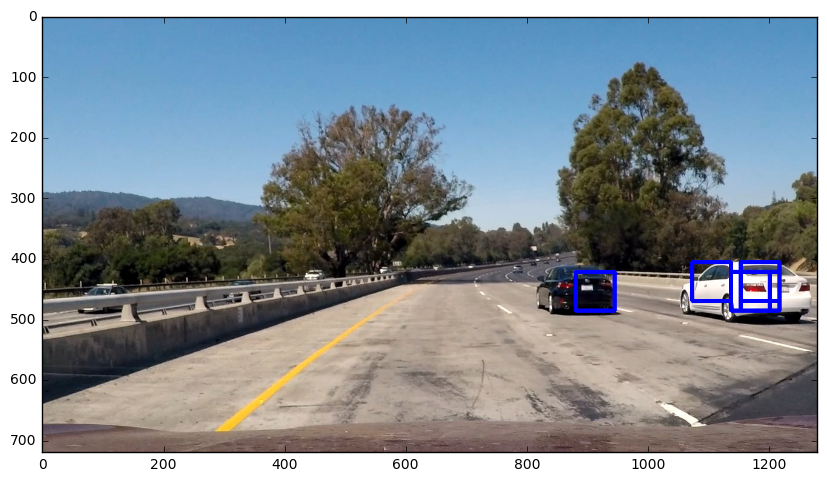

In [75]:
test_img_rects = draw_boxes(test_img, windows_61)
plt.figure(figsize=(10,10))
plt.imshow(test_img_rects)

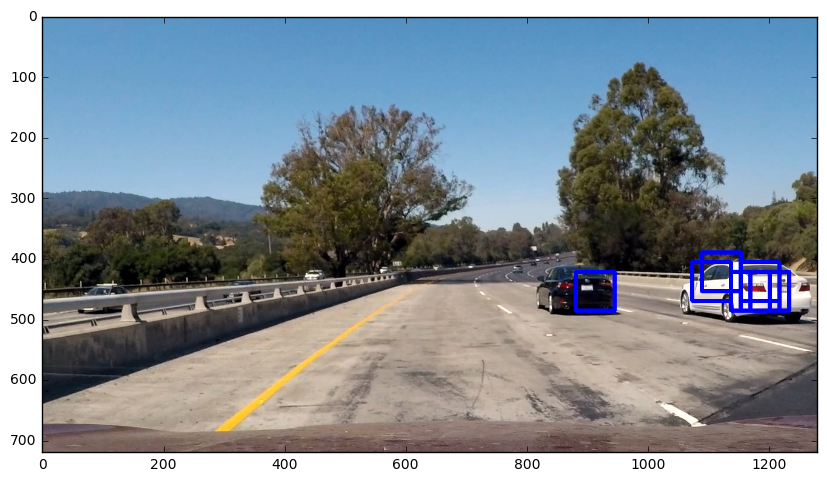

In [76]:
test_img_rects = draw_boxes(test_img, windows_49)
plt.figure(figsize=(10,10))
plt.imshow(test_img_rects)

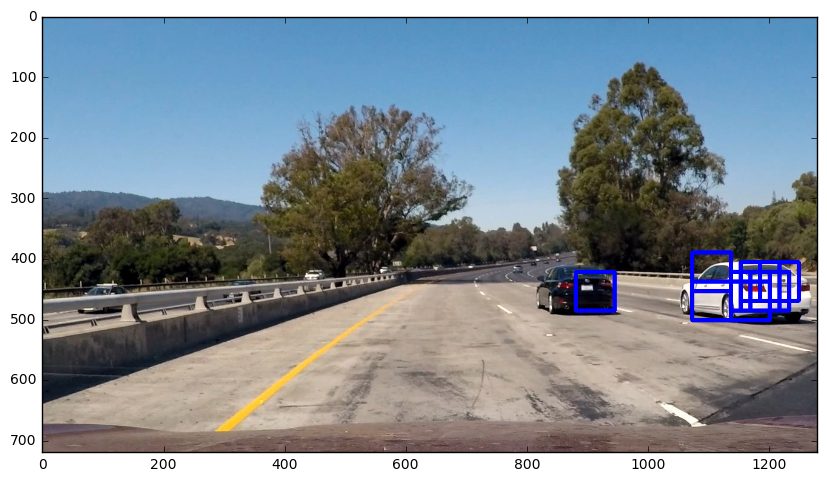

In [77]:
test_img_rects = draw_boxes(test_img, windows_13)
plt.figure(figsize=(10,10))
plt.imshow(test_img_rects)

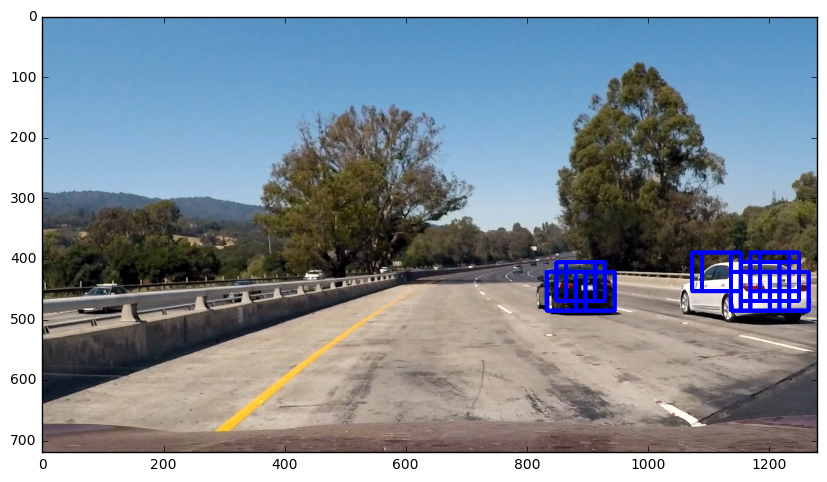

In [78]:
test_img_rects = draw_boxes(test_img, windows_50)
plt.figure(figsize=(10,10))
plt.imshow(test_img_rects)

#### Show the entire Search Areas
I call a few different ystart, ystop and scale values as the position or car and there distance from the camera can be different. These will help us decide the values of parameters that work best. 
**Note:** for the below exercise, I have chosen configuration 50

Number of boxes:  154


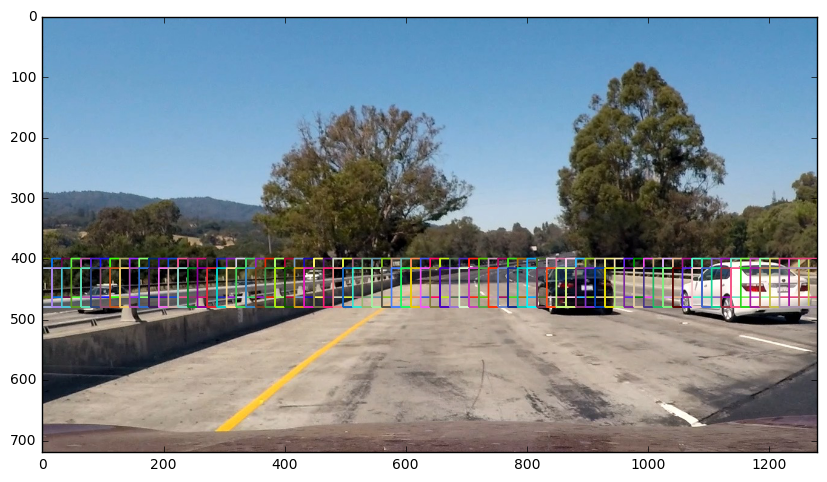

In [79]:
test_img = mpimg.imread('./test_images/test1.jpg')

windows = []

ystart = 400
ystop = 464
scale = 1.0
windows.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                       orient, pix_per_cell, cell_per_block, None, None, show_all_windows=True))
ystart = 416
ystop = 480
scale = 1.0
windows.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                       orient, pix_per_cell, cell_per_block, None, None, show_all_windows=True))

all_windows = [item for sublist in windows for item in sublist] 
test_img_Wwindows = draw_boxes(test_img, all_windows, color='random', thick=2)
plt.figure(figsize=(10,10))
plt.imshow(test_img_Wwindows)
print('Number of boxes: ', len(all_windows))

Number of boxes:  100


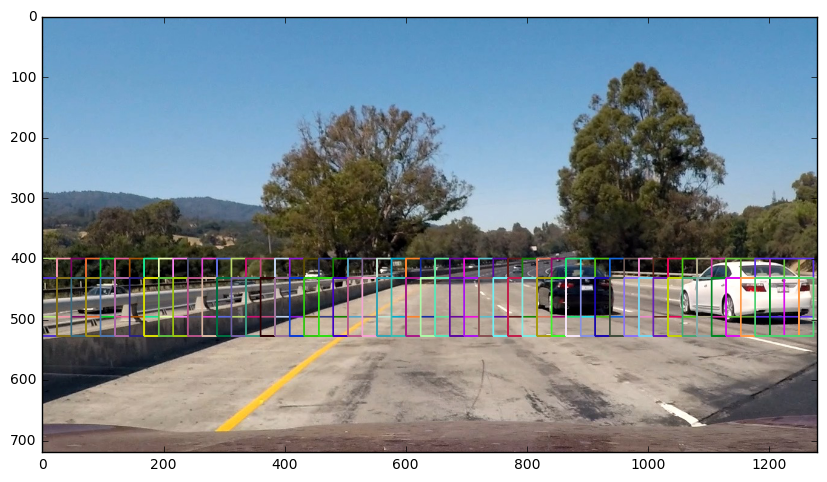

In [80]:
test_img = mpimg.imread('./test_images/test1.jpg')

windows = []

ystart = 400
ystop = 496
scale = 1.5
windows.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                       orient, pix_per_cell, cell_per_block, None, None, show_all_windows=True))
ystart = 432
ystop = 528
scale = 1.5
windows.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                       orient, pix_per_cell, cell_per_block, None, None, show_all_windows=True))

all_windows = [item for sublist in windows for item in sublist] 
test_img_Wwindow = draw_boxes(test_img, all_windows, color='random', thick=2)
plt.figure(figsize=(10,10))
plt.imshow(test_img_Wwindow)
print('Number of boxes: ', len(all_windows))

Number of boxes:  74


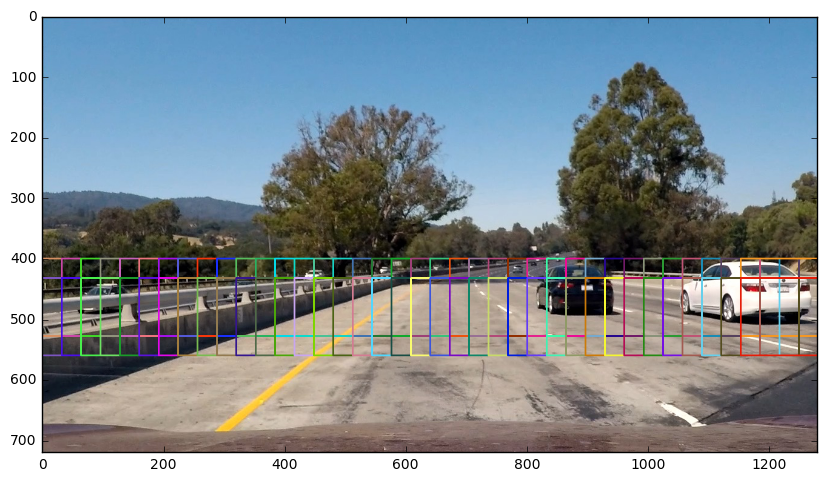

In [83]:
test_img = mpimg.imread('./test_images/test1.jpg')

windows = []

ystart = 400
ystop = 528
scale = 2.0
windows.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                       orient, pix_per_cell, cell_per_block, None, None, show_all_windows=True))
ystart = 432
ystop = 560
scale = 2.0
windows.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                       orient, pix_per_cell, cell_per_block, None, None, show_all_windows=True))

all_windows = [item for sublist in windows for item in sublist] 
test_img_Wwindow = draw_boxes(test_img, all_windows, color='random', thick=2)
plt.figure(figsize=(10,10))
plt.imshow(test_img_Wwindow)
print('Number of boxes: ', len(all_windows))

Number of boxes:  46


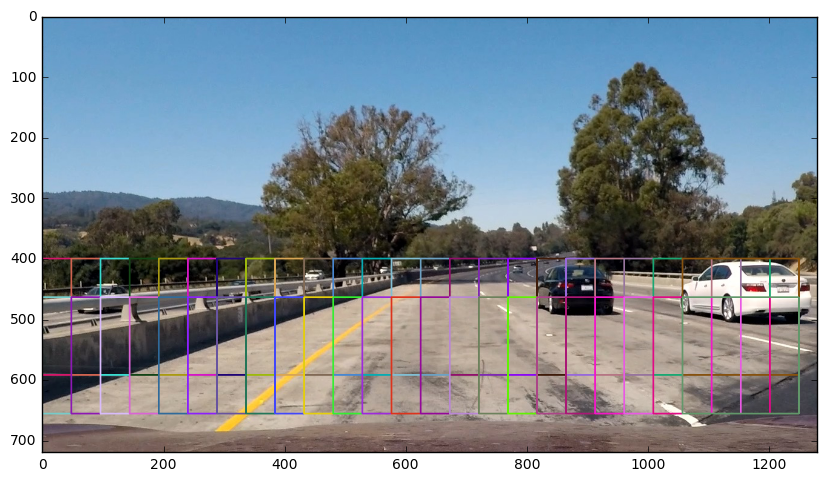

In [84]:
test_img = mpimg.imread('./test_images/test1.jpg')

windows = []

ystart = 400
ystop = 596
scale = 3.0
windows.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                       orient, pix_per_cell, cell_per_block, None, None, show_all_windows=True))
ystart = 464
ystop = 660
scale = 3.0
windows.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                       orient, pix_per_cell, cell_per_block, None, None, show_all_windows=True))

all_windows = [item for sublist in windows for item in sublist] 
test_img_Wwindow = draw_boxes(test_img, all_windows, color='random', thick=2)
plt.figure(figsize=(10,10))
plt.imshow(test_img_Wwindow)
print('Number of boxes: ', len(all_windows))

#### Combining various Sliding windows search

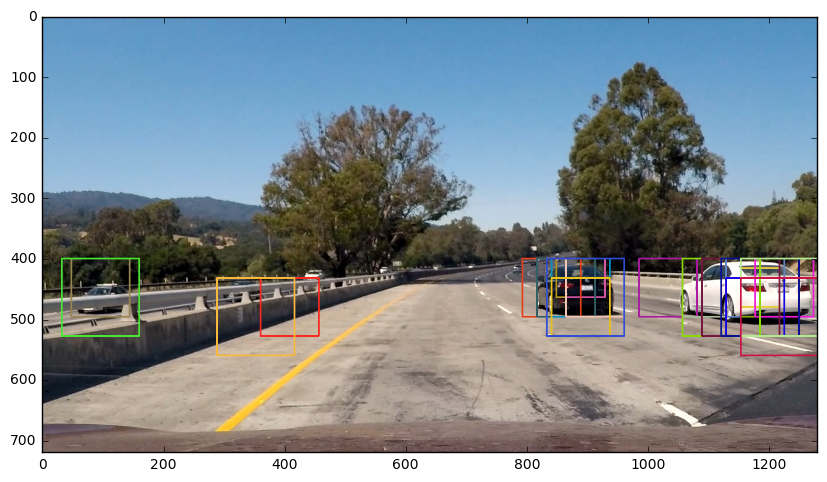

In [86]:
test_img = mpimg.imread('./test_images/test1.jpg')

windows = []

colorspace = 'YUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 11
pix_per_cell = 8
cell_per_block = 2
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"


ystart = 400
ystop = 464
scale = 1.0
windows.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                       orient, pix_per_cell, cell_per_block, None, None))
ystart = 416
ystop = 480
scale = 1.0
windows.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                       orient, pix_per_cell, cell_per_block, None, None))
ystart = 400
ystop = 496
scale = 1.5
windows.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                       orient, pix_per_cell, cell_per_block, None, None))
ystart = 432
ystop = 528
scale = 1.5
windows.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                       orient, pix_per_cell, cell_per_block, None, None))
ystart = 400
ystop = 528
scale = 2.0
windows.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                       orient, pix_per_cell, cell_per_block, None, None))
ystart = 432
ystop = 560
scale = 2.0
windows.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                       orient, pix_per_cell, cell_per_block, None, None))
ystart = 400
ystop = 596
scale = 3.5
windows.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                       orient, pix_per_cell, cell_per_block, None, None))
ystart = 464
ystop = 660
scale = 3.5
windows.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                       orient, pix_per_cell, cell_per_block, None, None))

# apparently this is the best way to flatten a list of lists
all_windows = [item for sublist in windows for item in sublist] 
test_img_windows = draw_boxes(test_img, all_windows, color='random', thick=2)
plt.figure(figsize=(10,10))
plt.imshow(test_img_windows)

#### HeatMap

In [91]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap

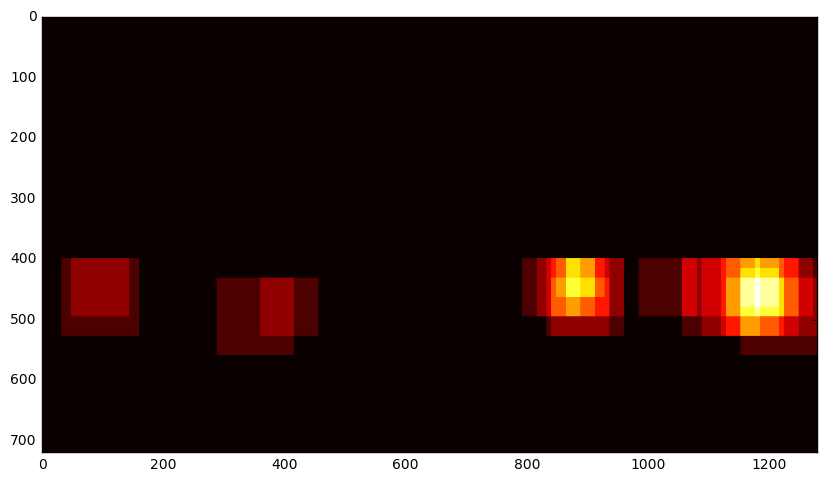

In [92]:
# Test out the heatmap
heatmap_img = np.zeros_like(test_img[:,:,0])
heatmap_img = add_heat(heatmap_img, all_windows)
plt.figure(figsize=(10,10))
plt.imshow(heatmap_img, cmap='hot')


#### Applying the Threshold

In [93]:
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap


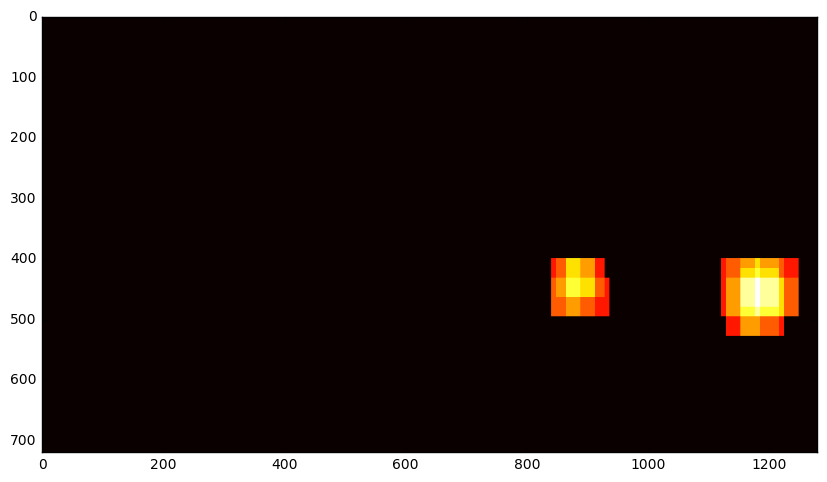

In [96]:
heatmap_img2 = apply_threshold(heatmap_img, 3)
plt.figure(figsize=(10,10))
plt.imshow(heatmap_img2, cmap='hot')

#### Apply labels


2 cars found


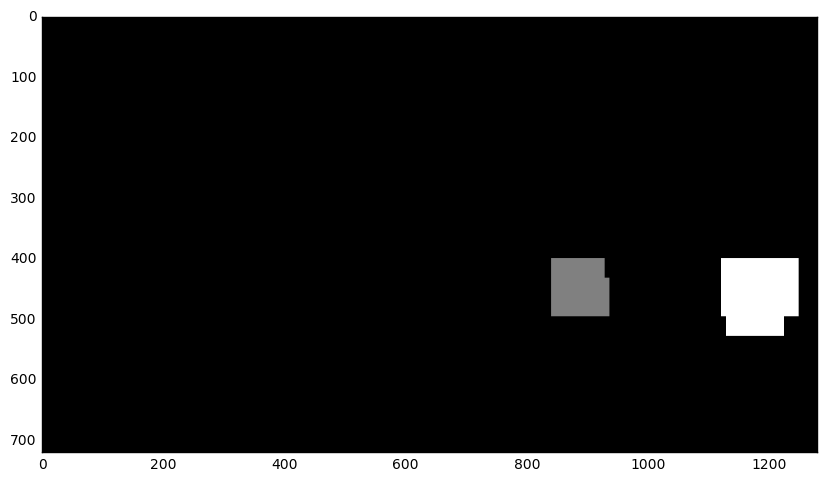

In [97]:
labels = label(heatmap_img2)
plt.figure(figsize=(10,10))
plt.imshow(labels[0], cmap='gray')
print(labels[1], 'cars found')

#### Draw Bounding Boxes for Labels

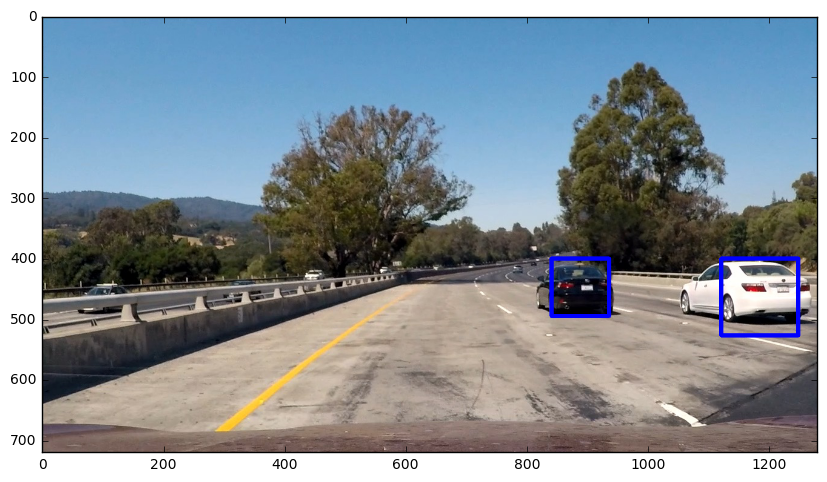

In [99]:
def labeled_boxes_img(img, labels):
    # Iterate through all detected cars
    rects = []
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        rects.append(bbox)
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image and final rectangles
    return img, rects

# Draw bounding boxes on a copy of the image
draw_img, window = labeled_boxes_img(np.copy(test_img), labels)
# Display the image
plt.figure(figsize=(10,10))
plt.imshow(draw_img)

#### Pipeline to create labelled box on individual images

In [127]:
def process_image(img, svc, colorspace, orient, pix_per_cell, pix_per_block, hog_channel):

    windows = []

    ystart = 400
    ystop = 464
    scale = 1.0
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = 416
    ystop = 480
    scale = 1.0
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = 400
    ystop = 496
    scale = 1.5
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = 432
    ystop = 528
    scale = 1.5
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = 400
    ystop = 528
    scale = 2.0
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = 432
    ystop = 560
    scale = 2.0
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = 400
    ystop = 596
    scale = 3.5
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = 464
    ystop = 660
    scale = 3.5
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None))

    all_windows = [item for sublist in windows for item in sublist] 
    
    heatmap_img = np.zeros_like(img[:,:,0])
    heatmap_img = add_heat(heatmap_img, all_windows)
    heatmap_img = apply_threshold(heatmap_img, 2)
    labels = label(heatmap_img)
    draw_img, boxes = labeled_boxes_img(np.copy(img), labels)
    return draw_img

#### Testing it on all images

**Configuration 50 **

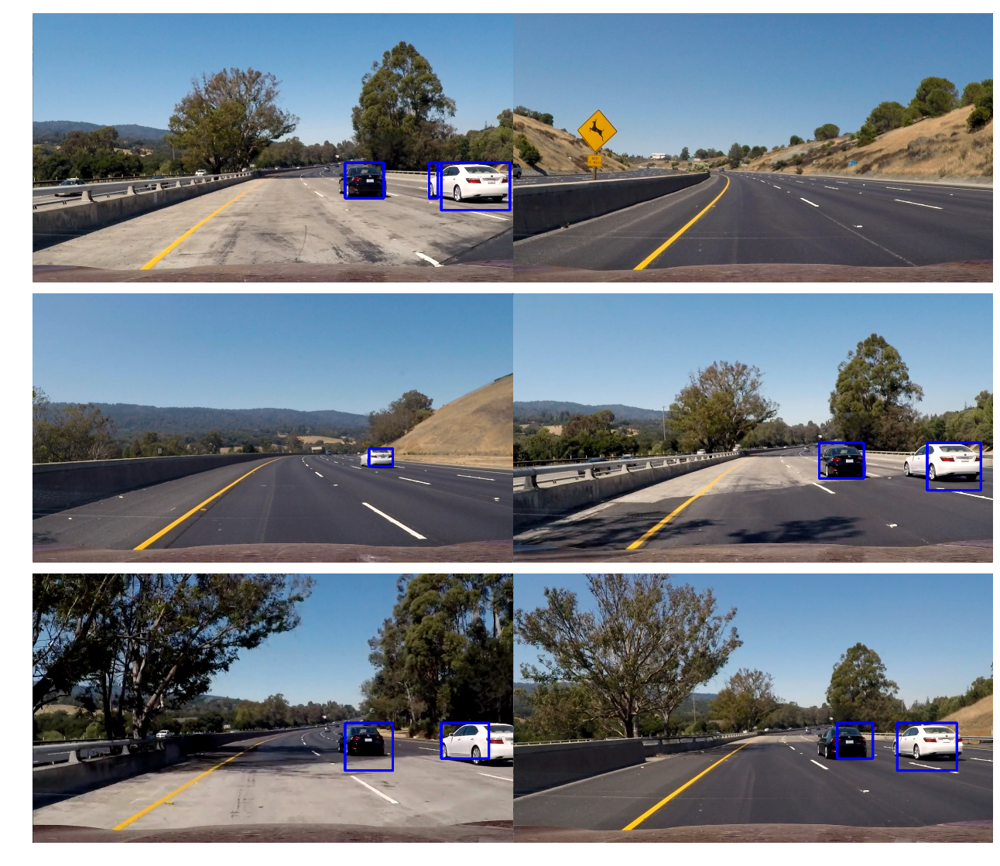

In [128]:
test_images = glob.glob('./test_images/test*.jpg')

fig, axs = plt.subplots(3, 2, figsize=(16,14))
fig.subplots_adjust(hspace = .004, wspace=.002)
axs = axs.ravel()

for i, im in enumerate(test_images):
    axs[i].imshow(process_image(mpimg.imread(im), svc_50, 'YUV', 11, 8, 2, 'ALL'))
    axs[i].axis('off')
    

**Configuration 13**

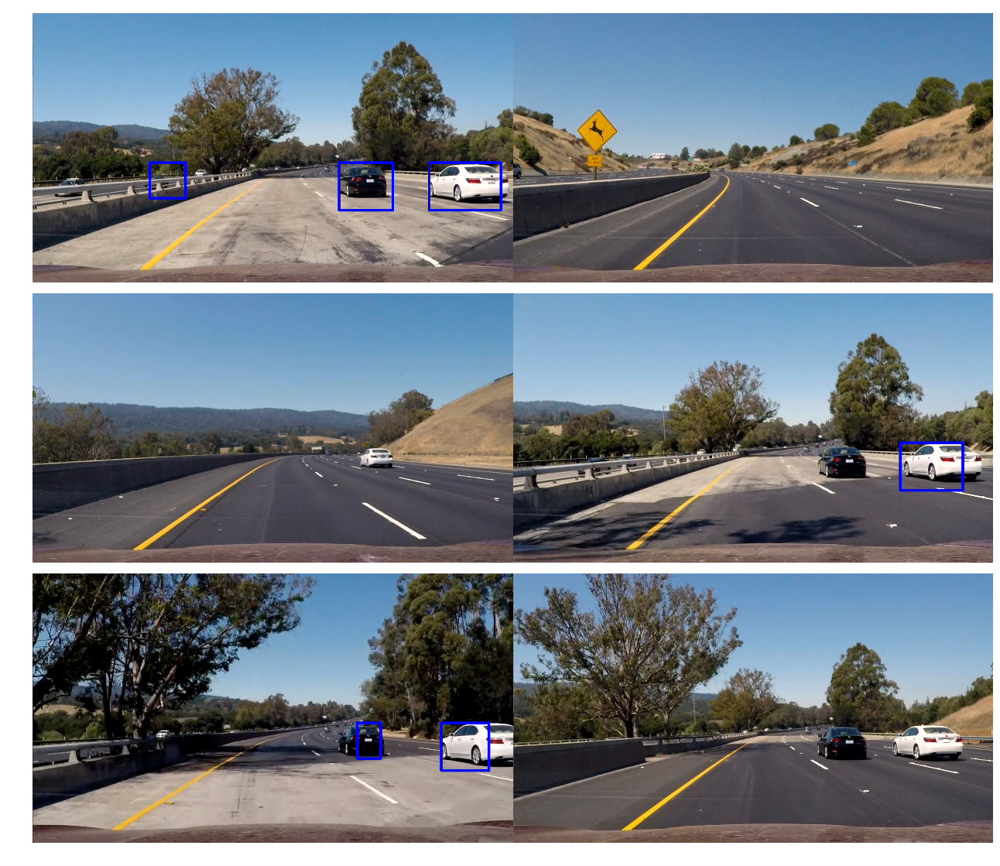

In [113]:
test_images = glob.glob('./test_images/test*.jpg')

fig, axs = plt.subplots(3, 2, figsize=(16,14))
fig.subplots_adjust(hspace = .004, wspace=.002)
axs = axs.ravel()

for i, im in enumerate(test_images):
    axs[i].imshow(process_image(mpimg.imread(im), svc_13, 'HSV', 10, 8, 2, 'ALL'))
    axs[i].axis('off')

**Configuration 49**

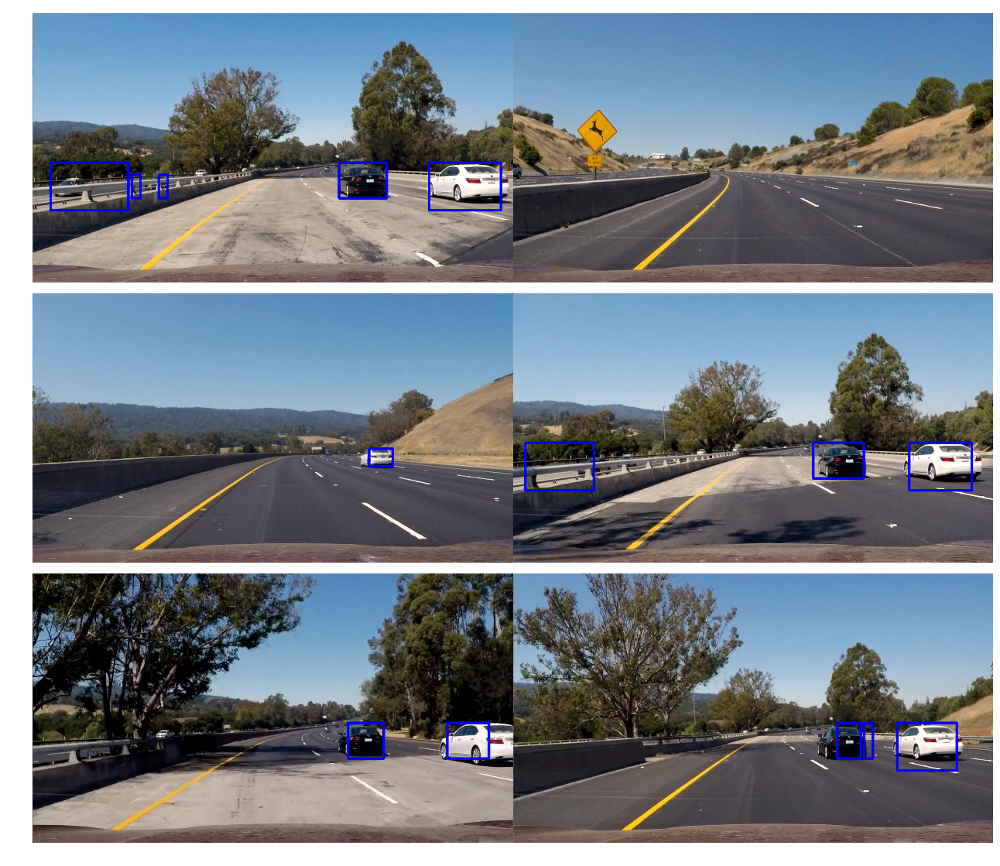

In [115]:
test_images = glob.glob('./test_images/test*.jpg')

fig, axs = plt.subplots(3, 2, figsize=(16,14))
fig.subplots_adjust(hspace = .004, wspace=.002)
axs = axs.ravel()

for i, im in enumerate(test_images):
    axs[i].imshow(process_image(mpimg.imread(im), svc_49, 'YUV', 10, 8, 2, 'ALL'))
    axs[i].axis('off')

**Configuration 61**

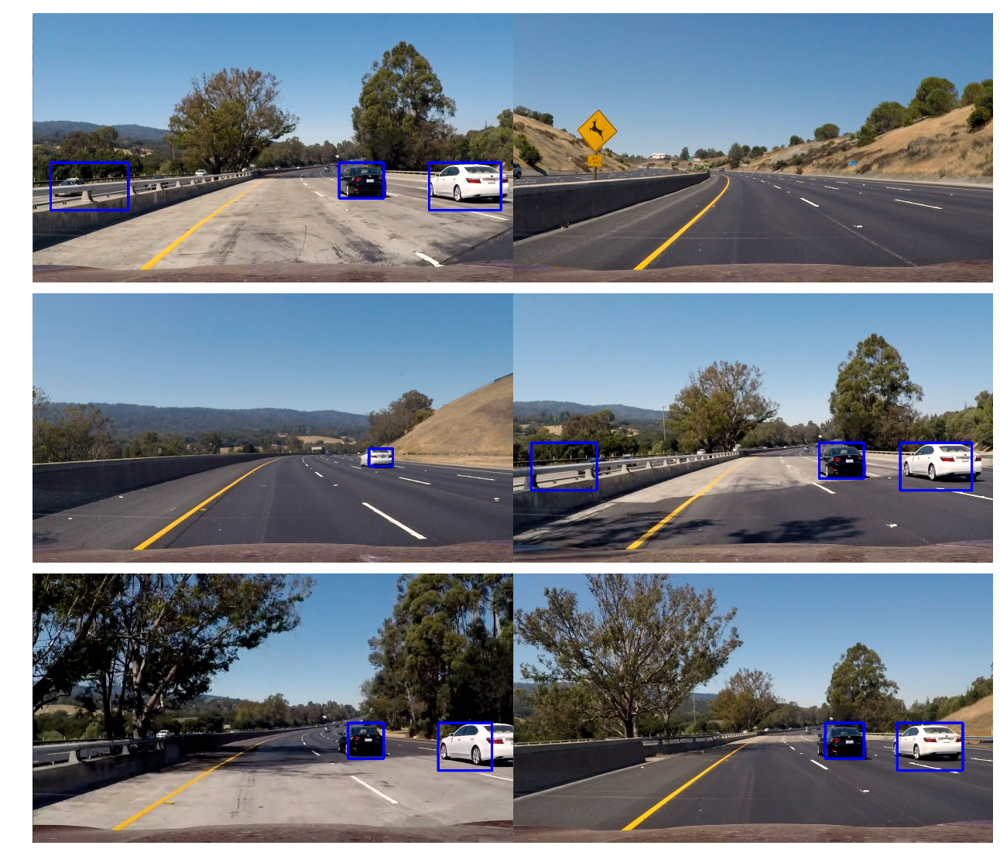

In [117]:
test_images = glob.glob('./test_images/test*.jpg')

fig, axs = plt.subplots(3, 2, figsize=(16,14))
fig.subplots_adjust(hspace = .004, wspace=.002)
axs = axs.ravel()

for i, im in enumerate(test_images):
    axs[i].imshow(process_image(mpimg.imread(im), svc_61, 'YCrCb', 10, 8, 2, 'ALL'))
    axs[i].axis('off')

### Note: Here we can observe, Parameter configuration 61 and 50 works best!! but For the purpose of this implementation I am going forward with config 50.

## Video Implementation

#### 1. Provide a link to your final video output. Your pipeline should perform reasonably well on the entire project video (somewhat wobbly or unstable bounding boxes are ok as long as you are identifying the vehicles most of the time with minimal false positives.)

In [129]:
# creating function for configuration 50 and configuration 61
def process_image50(img):

    windows = []

    colorspace = 'YUV'
    orient = 11
    pix_per_cell = 8
    cell_per_block = 2
    hog_channel = 'ALL'

    ystart = 400
    ystop = 464
    scale = 1.0
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = 416
    ystop = 480
    scale = 1.0
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = 400
    ystop = 496
    scale = 1.5
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = 432
    ystop = 528
    scale = 1.5
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = 400
    ystop = 528
    scale = 2.0
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = 432
    ystop = 560
    scale = 2.0
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = 400
    ystop = 596
    scale = 3.5
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = 464
    ystop = 660
    scale = 3.5
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                           orient, pix_per_cell, cell_per_block, None, None))

    all_windows = [item for sublist in windows for item in sublist] 
    
    heatmap_img = np.zeros_like(img[:,:,0])
    heatmap_img = add_heat(heatmap_img, all_windows)
    heatmap_img = apply_threshold(heatmap_img, 2)
    labels = label(heatmap_img)
    draw_img, boxes = labeled_boxes_img(np.copy(img), labels)
    return draw_img

#### Running on Videos

In [123]:
output_file = 'output_test_video.mp4'
clip_test = VideoFileClip('test_video.mp4')
clip_test_out = clip_test.fl_image(process_image50)
%time clip_test_out.write_videofile(output_file , audio=False)

[MoviePy] >>>> Building video output_test_video.mp4
[MoviePy] Writing video output_test_video.mp4


 97%|█████████▋| 38/39 [00:17<00:00,  2.24it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_test_video.mp4 

CPU times: user 15.2 s, sys: 2.08 s, total: 17.3 s
Wall time: 18.6 s


In [124]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_file))


#### Define a Class to Store Data from Vehicle Detections

In [132]:
# Define a class to store data from video
class Detect_Vehicle():
    def __init__(self):
        # history of rectangles previous n frames
        self.prev_boxes = [] 
        
    def add_boxes(self, boxes):
        self.prev_boxes.append(boxes)
        if len(self.prev_boxes) > 16:
            # throw out oldest rectangle set(s)
            self.prev_boxes = self.prev_boxes[len(self.prev_boxes)-16:]


In [135]:
def process_video(img):

    windows = []

    colorspace = 'YUV' #'HSV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
    orient = 11
    pix_per_cell = 8
    cell_per_block = 2
    hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
    
    ystart = 400
    ystop = 464
    scale = 1.0
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = 416
    ystop = 480
    scale = 1.0
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = 400
    ystop = 496
    scale = 1.5
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = 432
    ystop = 528
    scale = 1.5
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = 400
    ystop = 528
    scale = 2.0
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = 432
    ystop = 560
    scale = 2.0
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = 400
    ystop = 596
    scale = 3.5
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = 464
    ystop = 660
    scale = 3.5
    windows.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc_50, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
 
    all_windows = [item for sublist in windows for item in sublist] 
    
    # add detections to the history
    if len(all_windows) > 0:
        det.add_boxes(all_windows)
    
    heatmap_img = np.zeros_like(img[:,:,0])
    for window_set in det.prev_boxes:
        heatmap_img = add_heat(heatmap_img, window_set)
    heatmap_img = apply_threshold(heatmap_img, 1 + len(det.prev_boxes)//2)
     
    labels = label(heatmap_img)
    draw_img, boxes = labeled_boxes_img(np.copy(img), labels)
    return draw_img

In [136]:
det = Detect_Vehicle()

output_test_video2 = 'output_test_video2.mp4'
clip_test2 = VideoFileClip('test_video.mp4')
clip_test_out2 = clip_test2.fl_image(process_video)
%time clip_test_out2.write_videofile(output_test_video2, audio=False)

[MoviePy] >>>> Building video output_test_video2.mp4
[MoviePy] Writing video output_test_video2.mp4


 97%|█████████▋| 38/39 [00:18<00:00,  1.74it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_test_video2.mp4 

CPU times: user 16 s, sys: 2.23 s, total: 18.2 s
Wall time: 20 s


In [137]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_test_video2))

In [138]:
det = Detect_Vehicle()

output_proj_video = 'output_project_video.mp4'
clip_proj = VideoFileClip('project_video.mp4') #.subclip(23,26)  # subclip = only specified span of video
#clip_proj.save_frame('./test_images/project1.jpg', t=1.0) # saves the frame at time = t seconds
clip_proj_out = clip_proj.fl_image(process_video)
%time clip_proj_out.write_videofile(output_proj_video, audio=False)

[MoviePy] >>>> Building video output_project_video.mp4
[MoviePy] Writing video output_project_video.mp4


100%|█████████▉| 1260/1261 [10:02<00:00,  1.69it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_project_video.mp4 

CPU times: user 8min 38s, sys: 1min 9s, total: 9min 48s
Wall time: 10min 4s


In [139]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_proj_video))

In [140]:
det = Detect_Vehicle()

advlane_vechdetect_video = 'adv_lane&vechicle_detection_video.mp4'
clip_proj = VideoFileClip('project_video_output.mp4') #.subclip(23,26)  # subclip = only specified span of video
#clip_proj.save_frame('./test_images/project1.jpg', t=1.0) # saves the frame at time = t seconds
clip_proj_out = clip_proj.fl_image(process_video)
%time clip_proj_out.write_videofile(advlane_vechdetect_video, audio=False)

[MoviePy] >>>> Building video adv_lane&vechicle_detection_video.mp4
[MoviePy] Writing video adv_lane&vechicle_detection_video.mp4


100%|█████████▉| 1260/1261 [10:28<00:00,  1.86it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: adv_lane&vechicle_detection_video.mp4 

CPU times: user 8min 49s, sys: 1min 11s, total: 10min 1s
Wall time: 10min 29s


In [141]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(advlane_vechdetect_video))